In [3]:
df = pd.read_excel("2016-2017 nba.xlsx")

In [4]:
df.tail()

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PS/G
590,482,Cody Zeller\zelleco01,PF,24,CHO,62,58,27.8,4.1,7.1,...,0.679,2.2,4.4,6.5,1.6,1.0,0.9,1.0,3.0,10.3
591,483,Tyler Zeller\zellety01,C,27,BOS,51,5,10.3,1.5,3.1,...,0.564,0.8,1.6,2.4,0.8,0.1,0.4,0.4,1.2,3.5
592,484,Stephen Zimmerman\zimmest01,C,20,ORL,19,0,5.7,0.5,1.6,...,0.600,0.6,1.3,1.8,0.2,0.1,0.3,0.2,0.9,1.2
593,485,Paul Zipser\zipsepa01,SF,22,CHI,44,18,19.2,2.0,5.0,...,0.775,0.3,2.5,2.8,0.8,0.3,0.4,0.9,1.8,5.5
594,486,Ivica Zubac\zubaciv01,C,19,LAL,38,11,16.0,3.3,6.3,...,0.653,1.1,3.1,4.2,0.8,0.4,0.9,0.8,1.7,7.5


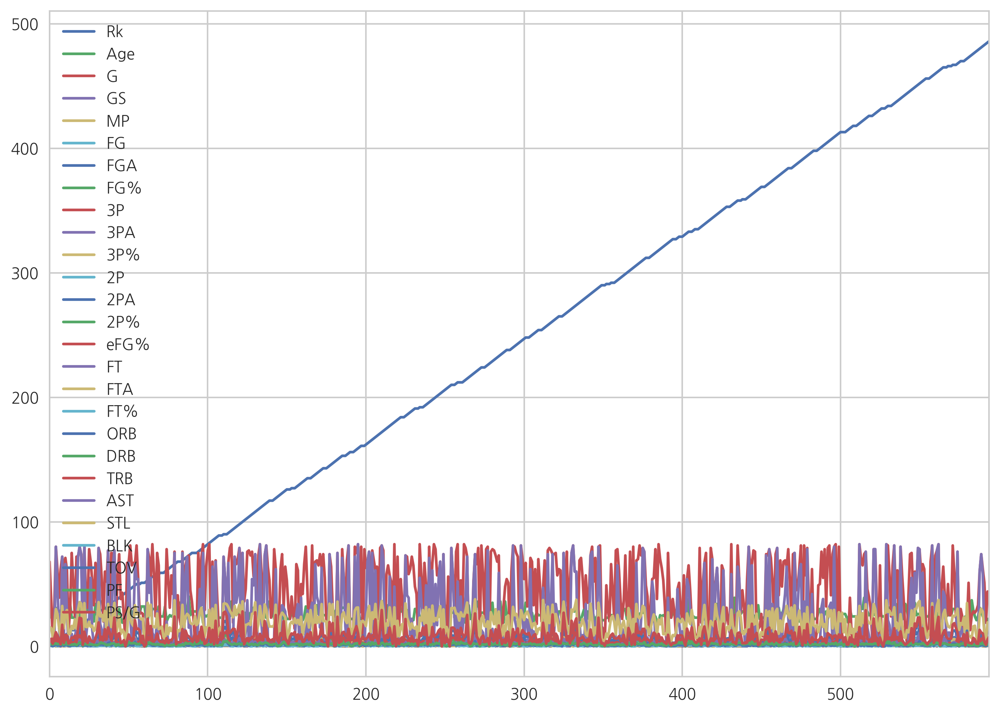

In [5]:
df.plot()

In [6]:
def heatmap(df):
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        ax = sns.heatmap(corr, mask=mask, vmax=.5, square=True,cmap="YlGnBu",annot=True)
    return ax

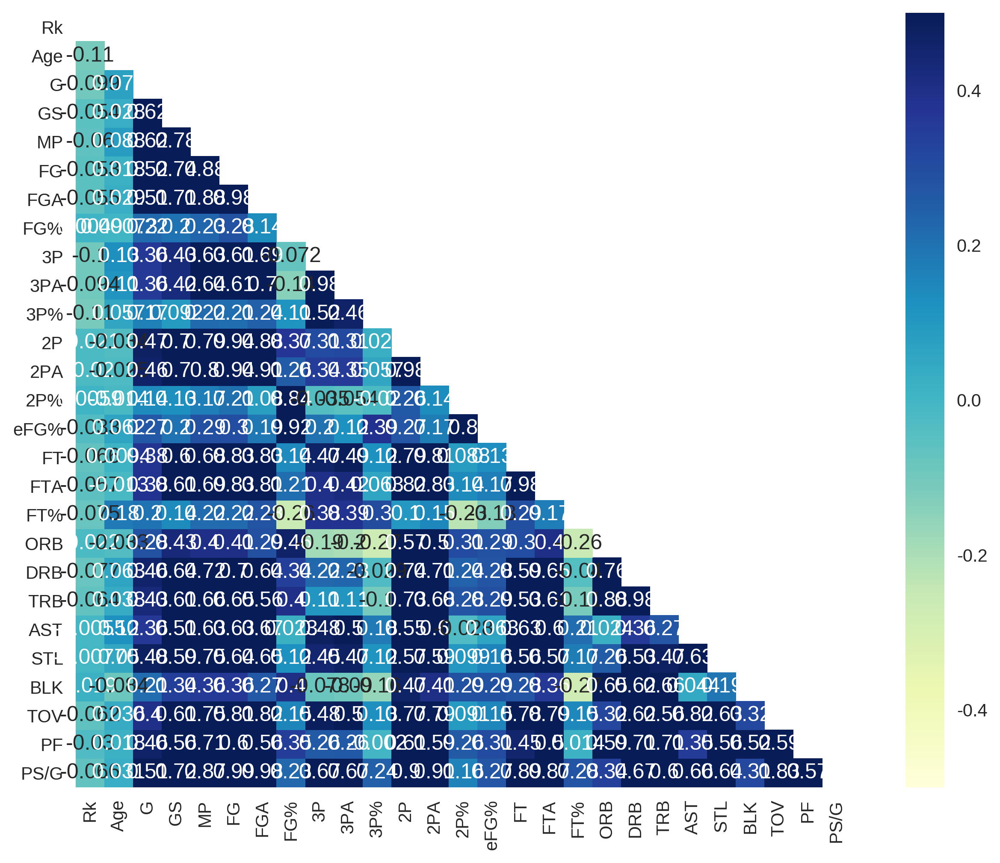

In [7]:
heatmap(df)

In [8]:
df.columns

Index([u'Rk', u'Player', u'Pos', u'Age', u'Tm', u'G', u'GS', u'MP', u'FG',
       u'FGA', u'FG%', u'3P', u'3PA', u'3P%', u'2P', u'2PA', u'2P%', u'eFG%',
       u'FT', u'FTA', u'FT%', u'ORB', u'DRB', u'TRB', u'AST', u'STL', u'BLK',
       u'TOV', u'PF', u'PS/G'],
      dtype='object')

{u'Rk' : "랭크, 이름별 숫자를 의미",  u'Player' : "플레이어 이름", u'Pos':"포지션", u'Age':"나이", u'Tm':"팀", u'G':"게임 수", u'GS':"게임 스타티드의 약자인데 뭔지는 모르겠", u'MP':"경기당 평균게임 시간", u'FG':"게임당 필드골 수",u'FGA':"게임당 필드골 횟수", u'FG%':"필드골 확률", u'3P':"경기당 3점 슛", u'3PA':"경기당 3점 슛 횟수", u'3P%':"경기당 3점 슛 성공률", u'2P':"2점슛 개수", u'2PA':"2점슛 시도횟수", u'2P%':"2점 성공률", u'eFG%':"effeictive field goal ",u'FT':"자유투", u'FTA':"자유투 시도횟수", u'FT%':"자유투 성공률", u'ORB':"오펜스 리바운드", u'DRB':"디펜스 리바운드", u'TRB':"토탈리바운드", u'AST':"어시스트", u'STL';"스틸", u'BLK':"블락",u'TOV':"턴오버", u'PF';"퍼스널 파울", u'PS/G':"게임 당 득점"}

- Effective Field Goal Percentage; the formula is (FG + 0.5 * 3P) / FGA. This statistic adjusts for the fact that a 3-point field goal is worth one more point than a 2-point field goal
- 필드골은 2점슛, 3점슛 모두 포함한 개념이며, 자유투를 뺀 개념을 의미한다.

In [220]:
df_new = df[[ u'FG%',  u'3P%', u'2P%',u'FT%', u'ORB', u'DRB', u'AST', u'STL', u'BLK', u'TOV', u'PF',"Pos","Player"]]

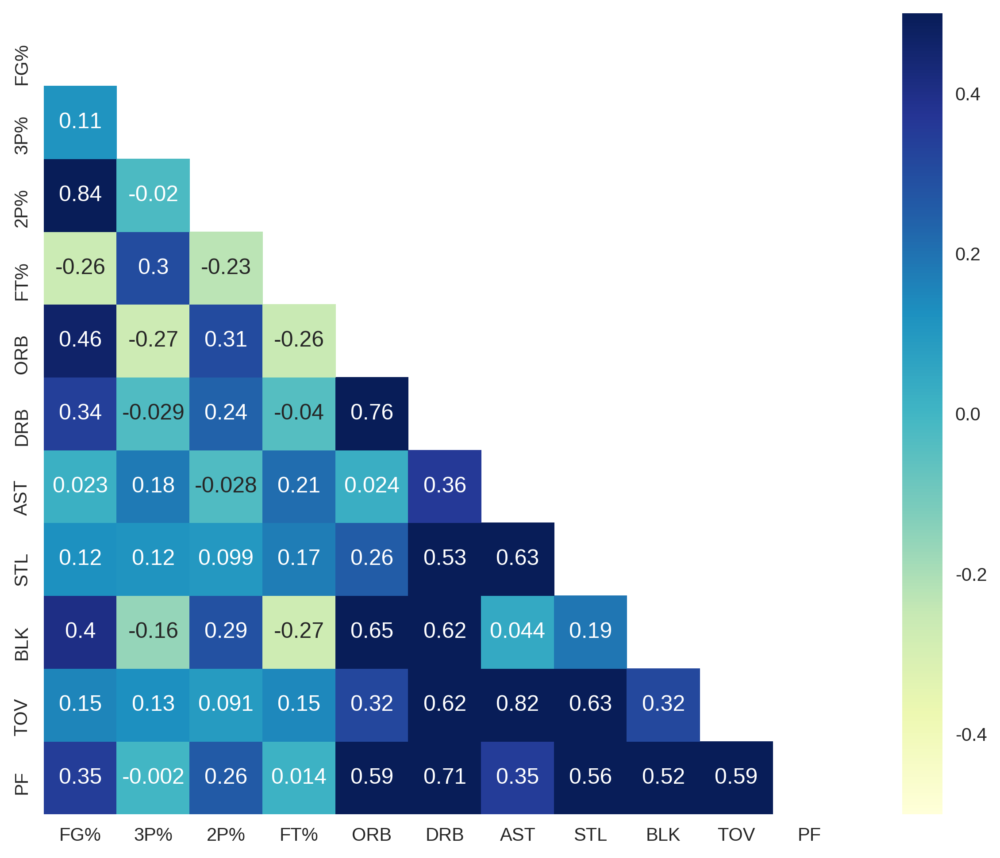

In [221]:
heatmap(df_new)

## 보편적이 지표로 보게 되면 아래와 같은 상관관계를 찾을 수가 있음.
- 필드골 확률은 <오펜스 리바운드>, <2점슛 성공률>
- 오펜스 리바운드는 <디펜스 리바운드>,<블락>,<퍼스널 파울>
- 디펜스 리바운드는 <퍼스널 파울>,<퍼스널 파울> / + <턴오버>
- 어시스트는 <턴오버>, <스틸> 
- 스틸은 <퍼스널 파울>, <턴오버>
- 블락은 <퍼스널 파울>


음 얼키고 설키다 보니 이걸 어떻게 설정해야 할지가 주요문제 인듯
다른 요인들을 무엇으로 추가할지


- 일단은 일차적으로 pca대해서 알아 볼것은 
예를 들어 a,b,c,d,e 요인이 있는 것 중에서 a,b,c 묶어서 pca돌리고 c,d,e묶어서 돌리는 것이 가능하지 알아봐야 할듯

- 위에 것이 불가능하다면 음 아래와 같이 묶어보자.
1.오펜스리바운드, 디펜스 리바운드, 블락, 퍼스널 파울
2.어시스트, 턴오버, 스틸

- 아니면 전체 pca를 돌린다음에 요소를 뽑아내는 건지 음..

#### plot 으로 그림 그려보기

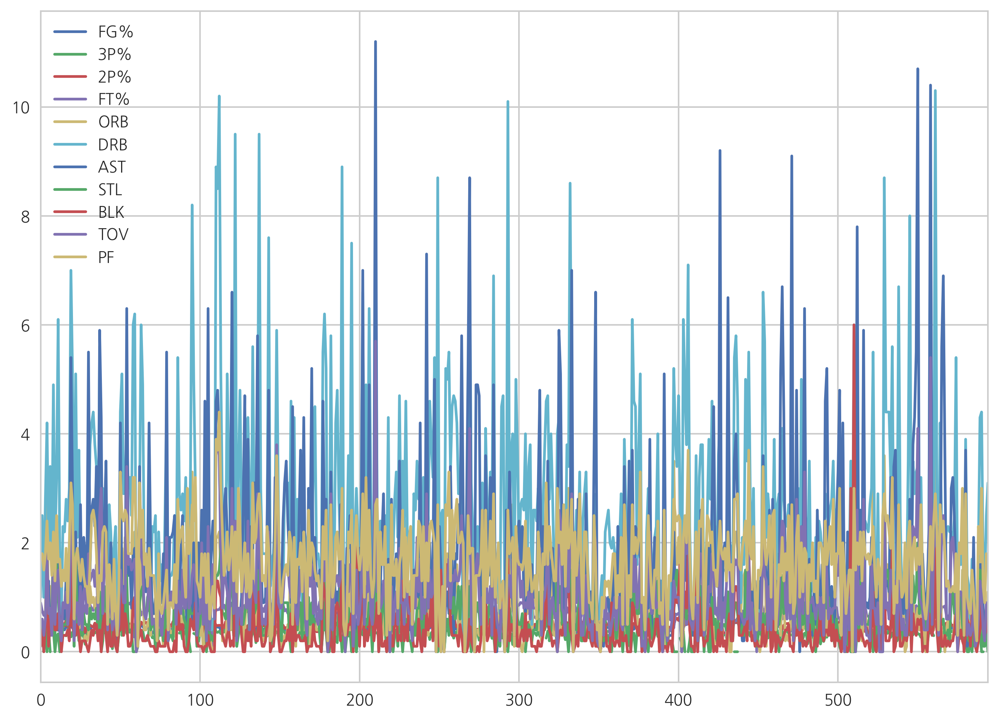

In [222]:
df_new.plot()

#### 조잡하니까 나눠서 해보기
- % 끼리의 값
- 정수 값들끼리

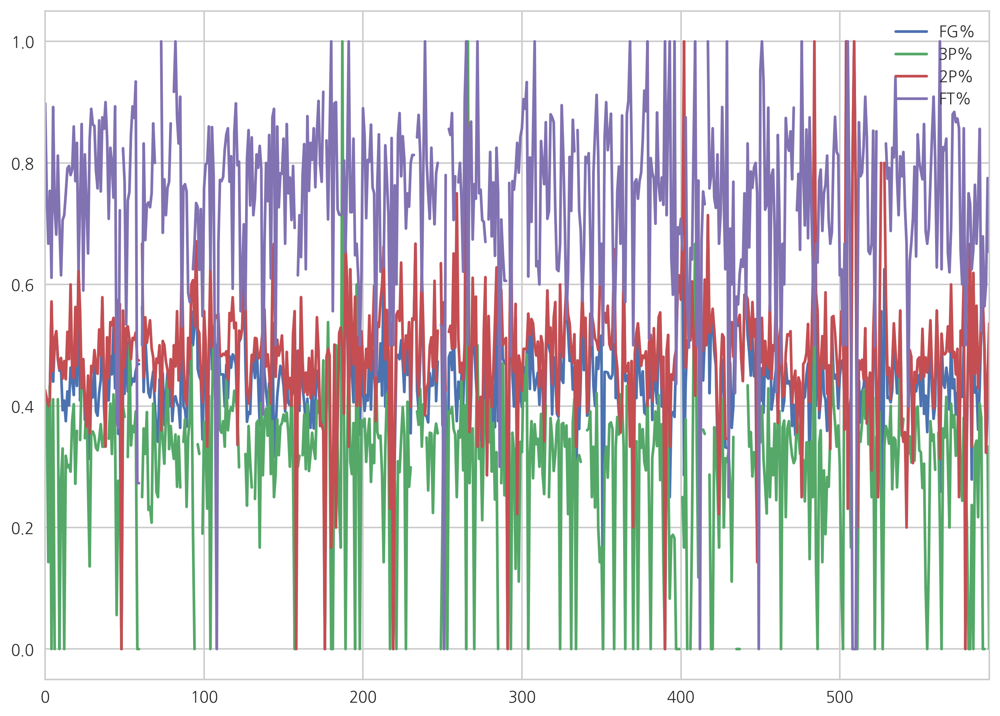

In [223]:
df_new.iloc[:,:4].plot()

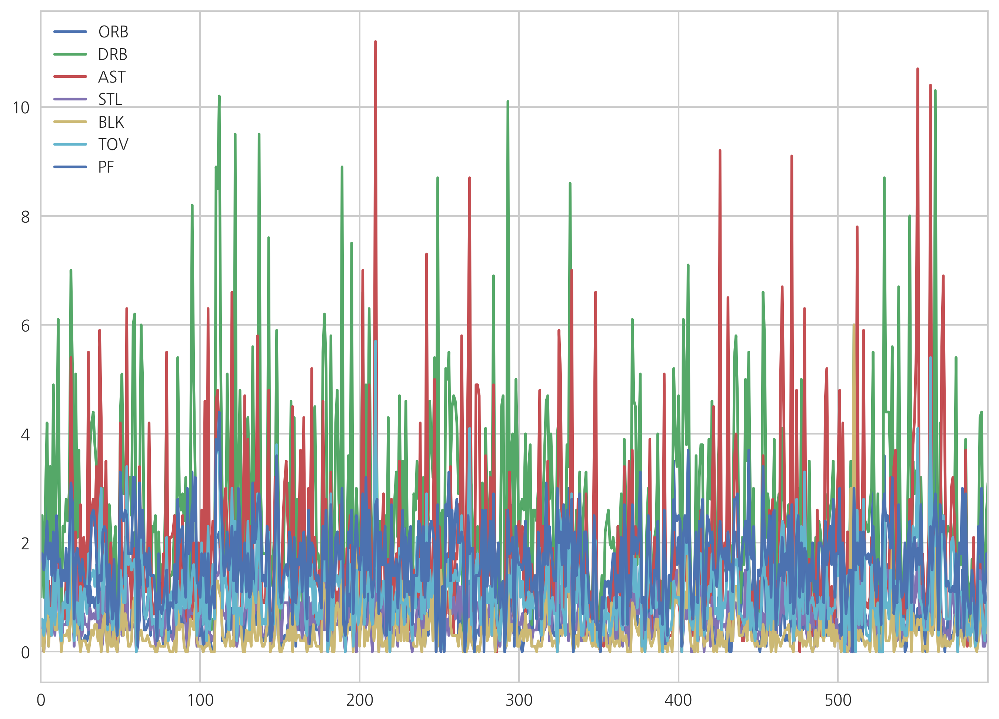

In [224]:
df_new.iloc[:,4:].plot()

#### 음...그래프가 어느정도 모양을 띄며, 그것이 반복된다.

#### pca 분석 돌려보기

In [ ]:
df_new = df[[ u'FG%',  u'3P%', u'2P%',u'FT%', u'ORB', u'DRB', u'AST', u'STL', u'BLK', u'TOV', u'PF',"Pos","Player"]]

In [348]:
df_new.isnull().any()
# nan값이 포함되어있다.음..

FG%        True
3P%        True
2P%        True
FT%        True
ORB       False
DRB       False
AST       False
STL       False
BLK       False
TOV       False
PF        False
Pos       False
Player    False
dtype: bool

In [349]:
df_new.count()
# 갯수를 체크하니 아래와 같다.

FG%       593
3P%       549
2P%       590
FT%       571
ORB       595
DRB       595
AST       595
STL       595
BLK       595
TOV       595
PF        595
Pos       595
Player    595
dtype: int64

In [350]:
df_new1 = df_new.dropna(how="any")
df_new1.count()

FG%       531
3P%       531
2P%       531
FT%       531
ORB       531
DRB       531
AST       531
STL       531
BLK       531
TOV       531
PF        531
Pos       531
Player    531
dtype: int64

In [351]:
X = df_new1.iloc[:,:11].values
X[:10]

array([[ 0.393,  0.381,  0.426,  0.898,  0.3  ,  1.   ,  0.6  ,  0.5  ,
         0.1  ,  0.5  ,  1.7  ],
       [ 0.412,  0.411,  0.413,  0.75 ,  0.5  ,  2.5  ,  0.5  ,  0.4  ,
         0.4  ,  0.6  ,  1.8  ],
       [ 0.294,  0.143,  0.4  ,  0.667,  0.3  ,  1.   ,  0.   ,  0.   ,
         0.   ,  0.3  ,  1.5  ],
       [ 0.425,  0.434,  0.414,  0.754,  0.6  ,  2.8  ,  0.6  ,  0.4  ,
         0.5  ,  0.6  ,  1.8  ],
       [ 0.571,  0.   ,  0.572,  0.611,  3.5  ,  4.2  ,  1.1  ,  1.1  ,
         1.   ,  1.8  ,  2.4  ],
       [ 0.44 ,  0.411,  0.457,  0.892,  0.1  ,  1.9  ,  1.3  ,  0.3  ,
         0.1  ,  0.7  ,  1.7  ],
       [ 0.5  ,  0.   ,  0.511,  0.725,  1.2  ,  3.4  ,  0.3  ,  0.5  ,
         0.6  ,  0.8  ,  2.   ],
       [ 0.477,  0.411,  0.48 ,  0.812,  2.4  ,  4.9  ,  1.9  ,  0.6  ,
         1.2  ,  1.4  ,  2.2  ],
       [ 0.458,  0.   ,  0.461,  0.697,  1.7  ,  1.9  ,  0.9  ,  0.3  ,
         0.4  ,  0.5  ,  1.3  ],
       [ 0.461,  0.278,  0.479,  0.615,  2.3  ,  3.2  ,

In [352]:
y = df_new1.iloc[:,11].values
y[:10]

array([u'SG', u'PF', u'PF', u'PF', u'C', u'SG', u'C', u'PF', u'PF', u'SG'], dtype=object)

In [353]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)

In [354]:
import numpy as np
mean_vec = np.mean(X_std, axis=0)
cov_mat = (X_std - mean_vec).T.dot((X_std - mean_vec)) / (X_std.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat)

Covariance matrix 
[[ 1.00188679  0.00252557  0.85438835 -0.15633154  0.5050523   0.38034262
   0.03310978  0.16665693  0.42792226  0.17851831  0.33207615]
 [ 0.00252557  1.00188679 -0.05312968  0.29838373 -0.3077577  -0.06014487
   0.15975287  0.09269359 -0.19118629  0.09796067 -0.05828535]
 [ 0.85438835 -0.05312968  1.00188679 -0.12619113  0.34170276  0.27354023
   0.0045692   0.1511603   0.29738057  0.1300099   0.26880259]
 [-0.15633154  0.29838373 -0.12619113  1.00188679 -0.24350631 -0.03596195
   0.19712737  0.12856748 -0.17458319  0.14614694  0.00715805]
 [ 0.5050523  -0.3077577   0.34170276 -0.24350631  1.00188679  0.75708847
   0.02943763  0.29005193  0.65566846  0.3035213   0.58400374]
 [ 0.38034262 -0.06014487  0.27354023 -0.03596195  0.75708847  1.00188679
   0.35220596  0.53326932  0.67595036  0.61612978  0.71214828]
 [ 0.03310978  0.15975287  0.0045692   0.19712737  0.02943763  0.35220596
   1.00188679  0.61515193  0.05991994  0.82457043  0.34728608]
 [ 0.16665693  0.09269

In [355]:
cov_mat = np.cov(X_std.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[  2.80336460e-01   3.16501725e-01  -5.16146848e-01   9.78129909e-02
   -4.93048113e-02  -5.94752389e-01  -1.39873399e-01  -3.95306122e-01
    8.11863328e-02  -6.67908411e-02  -4.70964329e-02]
 [ -4.29119875e-02  -3.09370228e-01  -4.89169556e-01  -3.69745239e-01
    7.03074308e-01   1.45959509e-01   5.18633416e-02  -4.58656685e-02
   -2.04713572e-03  -7.62496673e-02   1.48626176e-02]
 [  2.32841756e-01   3.03471706e-01  -5.67413936e-01   2.15002339e-01
   -2.06043572e-01   4.93602769e-01   9.15060681e-02   4.16546829e-01
   -5.74411436e-02   1.04646033e-01   5.72058911e-02]
 [ -3.18957712e-02  -3.74254813e-01  -2.47362250e-01  -5.89533616e-01
   -6.59474166e-01   1.69914376e-02   3.14624568e-03  -5.94598055e-02
    7.47445337e-02  -4.26768707e-02  -6.34800320e-02]
 [  3.61600707e-01   2.74642536e-01   2.01258114e-01  -1.80261655e-01
   -1.63265055e-04   3.92894860e-01   2.14663326e-01  -3.93534331e-01
    3.81156874e-03  -6.04390072e-01  -1.41214855e-02]
 [  4.22564003e-

In [356]:
u,s,v = np.linalg.svd(X_std.T)

In [357]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i[0])

Eigenvalues in descending order:
4.38877438879
2.25761650219
1.3275189594
0.854706968372
0.684698176214
0.461863916907
0.355856089442
0.316056778613
0.173707691264
0.107384385465
0.092570860333


In [358]:
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

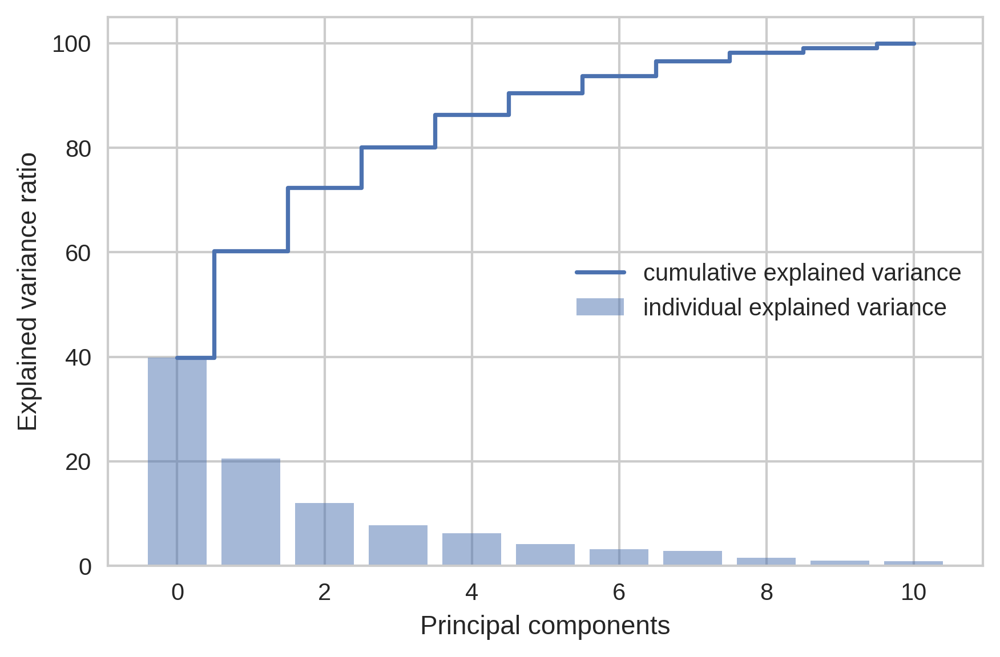

In [359]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance')
    plt.step(range(11), cum_var_exp, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

#### 즉 4개까지만 components를 살려준다.

In [360]:
matrix_w = np.hstack((eig_pairs[0][1].reshape(-1,1),eig_pairs[1][1].reshape(-1,1),
                eig_pairs[2][1].reshape(-1,1),eig_pairs[3][1].reshape(-1,1)))
print('Matrix W:\n', matrix_w)

Matrix W:
 [[ 0.28033646  0.31650173 -0.51614685  0.09781299]
 [-0.04291199 -0.30937023 -0.48916956 -0.36974524]
 [ 0.23284176  0.30347171 -0.56741394  0.21500234]
 [-0.03189577 -0.37425481 -0.24736225 -0.58953362]
 [ 0.36160071  0.27464254  0.20125811 -0.18026165]
 [ 0.422564   -0.00206136  0.15303659 -0.22590916]
 [ 0.23595581 -0.47383397 -0.03336036  0.42312504]
 [ 0.32025115 -0.30888612  0.0045334   0.15546103]
 [ 0.34519336  0.21322066  0.17798043 -0.30808771]
 [ 0.34885649 -0.35820937  0.02638945  0.21612188]
 [ 0.39487561 -0.05306546  0.11716224 -0.17772548]]


In [361]:
df_new.columns

Index([u'FG%', u'3P%', u'2P%', u'FT%', u'ORB', u'DRB', u'AST', u'STL', u'BLK',
       u'TOV', u'PF', u'Pos', u'Player'],
      dtype='object')

#### 보기가 힘드니까 표로 다시 만들기

In [362]:
pd.DataFrame(matrix_w,index=[u'FG%',  u'3P%', u'2P%',u'FT%', u'ORB', u'DRB', u'AST', u'STL', u'BLK', u'TOV', u'PF'])

,0,1,2,3
FG%,0.280336,0.316502,-0.516147,0.097813
3P%,-0.042912,-0.309370,-0.489170,-0.369745
2P%,0.232842,0.303472,-0.567414,0.215002
FT%,-0.031896,-0.374255,-0.247362,-0.589534
ORB,0.361601,0.274643,0.201258,-0.180262
DRB,0.422564,-0.002061,0.153037,-0.225909
AST,0.235956,-0.473834,-0.033360,0.423125
STL,0.320251,-0.308886,0.004533,0.155461
BLK,0.345193,0.213221,0.177980,-0.308088
TOV,0.348856,-0.358209,0.026389,0.216122


### 제가 드린 자료에는 0.4이상을 기준으로 잡은거 같은데..음 0.3이상을 기준으로 일단 설명을 해보면~

#### 첫 번째 열 같은 경우에는 (+)'ORB',(+) 'DRB', (+)'STL',(+) 'BLK',(+)'TOV',(+) 'PF'
#### 두 번째 열 같은 경우에는 (+)FG, (-)'3P%', (+)'2P%', '(-)FT%',  (-)'AST', (-)'STL',(-)TOV
#### 세 번째 열 같은 경우에는 (-)FG, (-)3P%, (-)2P%,
#### 네 번째 열 같은 경우에는 (-)3p%, -FT(%), (+)AST, (-)BLK

- 첫 번째 분류는 턴오버만 없으면 블루워커로 설명이 가능(리바운드, 스틸, 블락 등)
- 두 번째 분류는 골밑을 제압하는 스타일(오닐 같은~)
- 세 번째 분류는 이 분류는 무슨 분류일까...
- 네 번째 분류는 어시스트만 하는 걸까.

In [363]:
Y = X_std.dot(matrix_w)

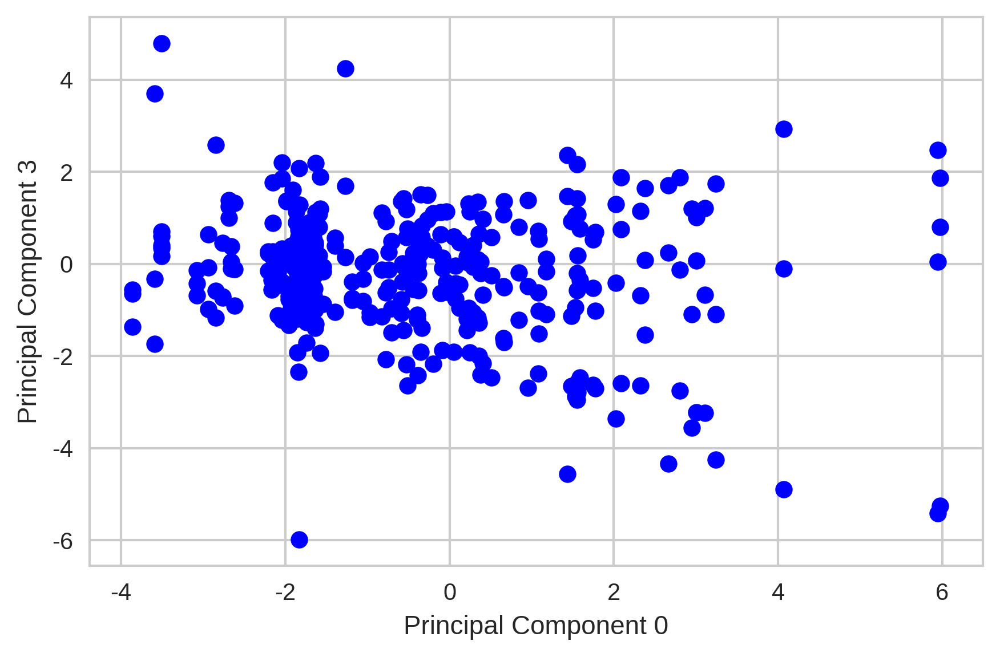

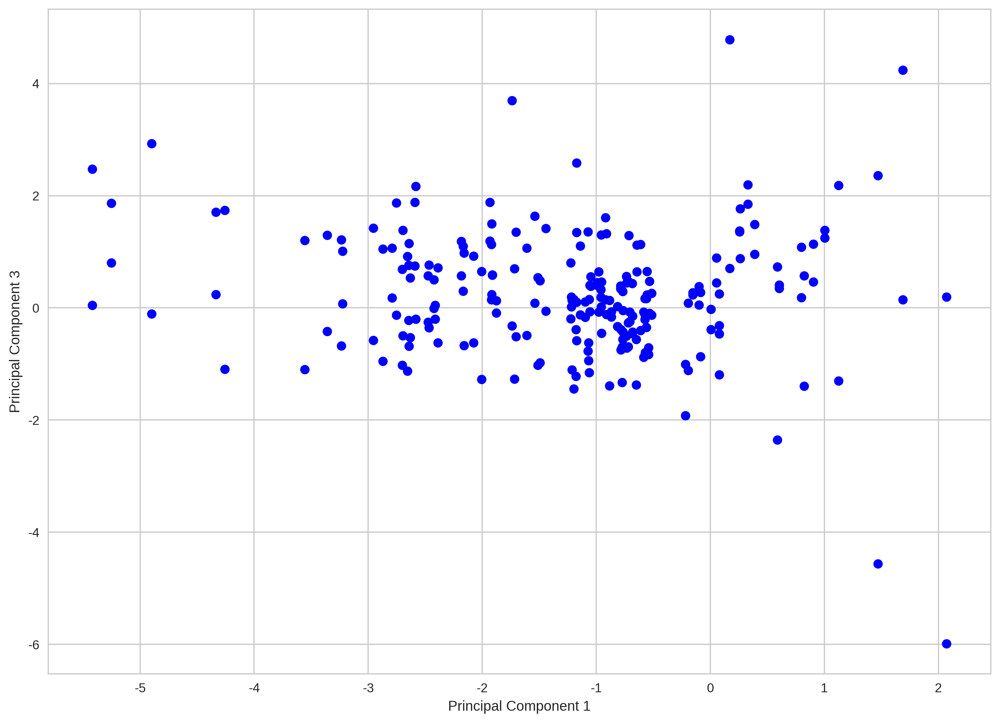

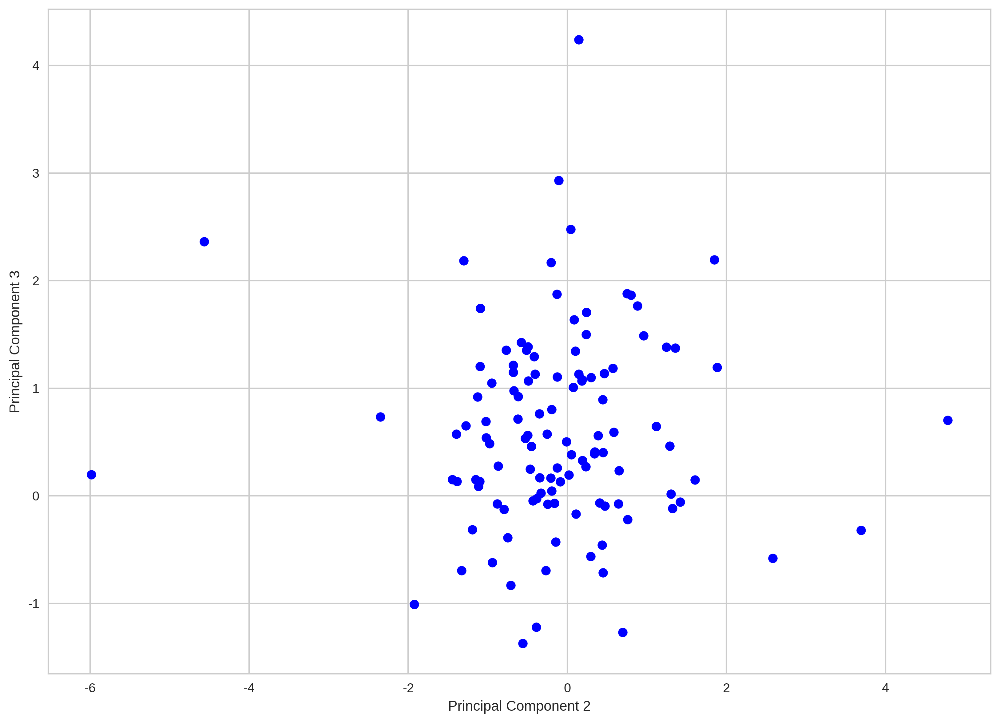

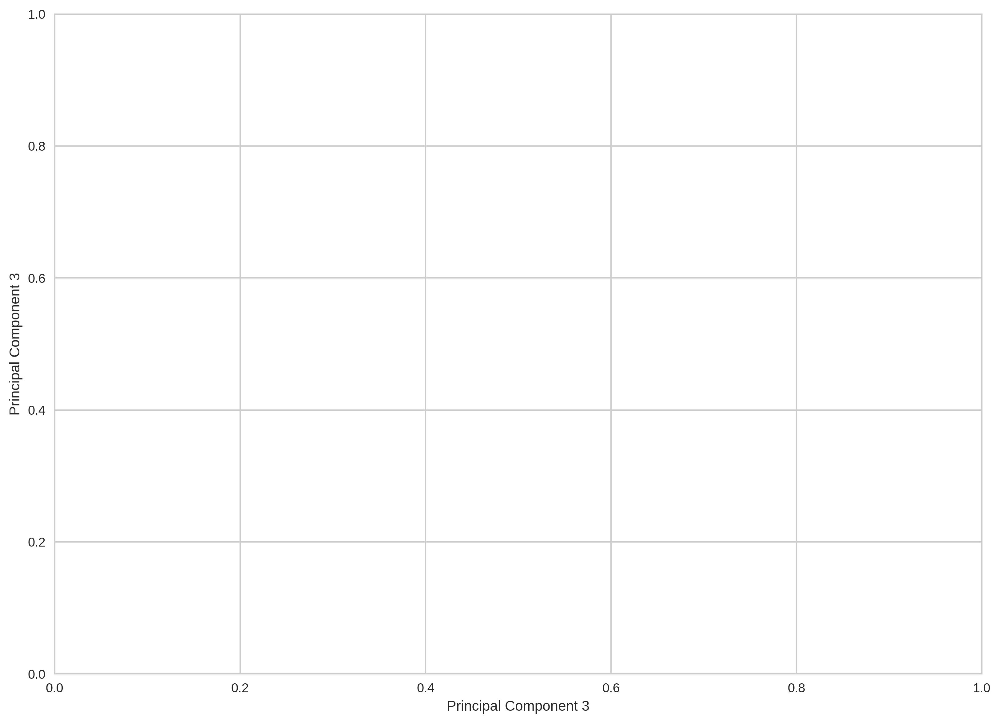

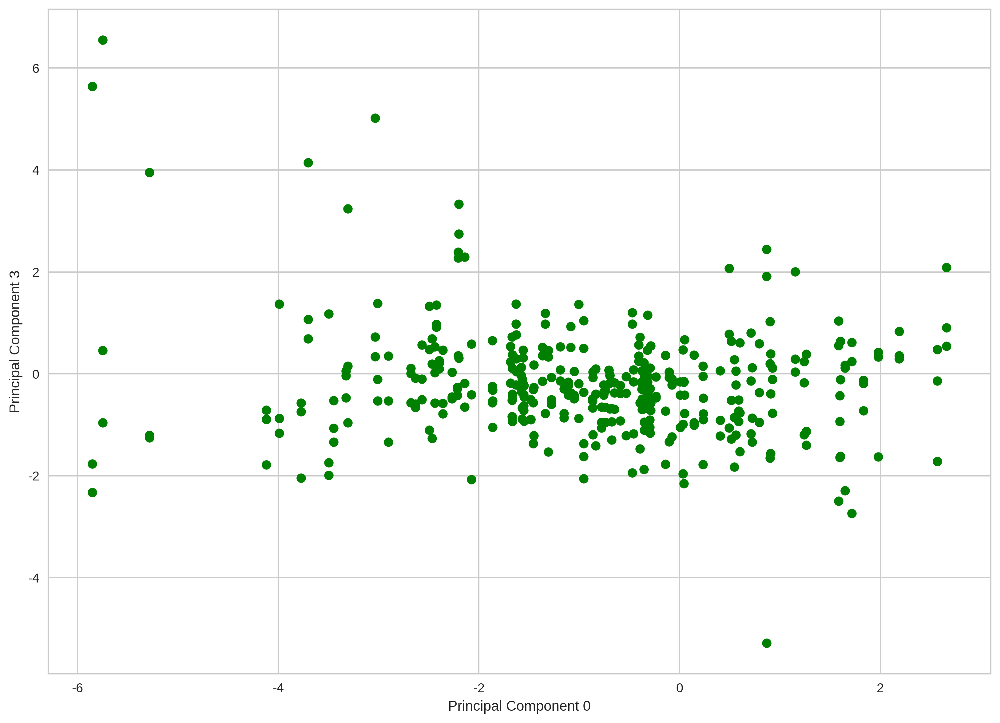

...

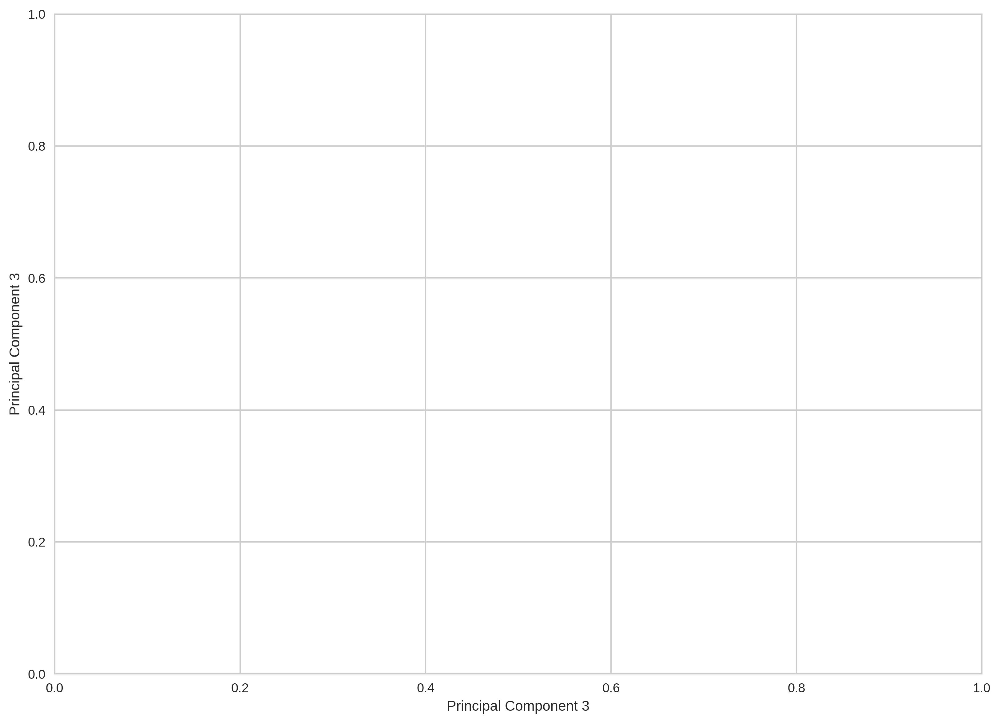

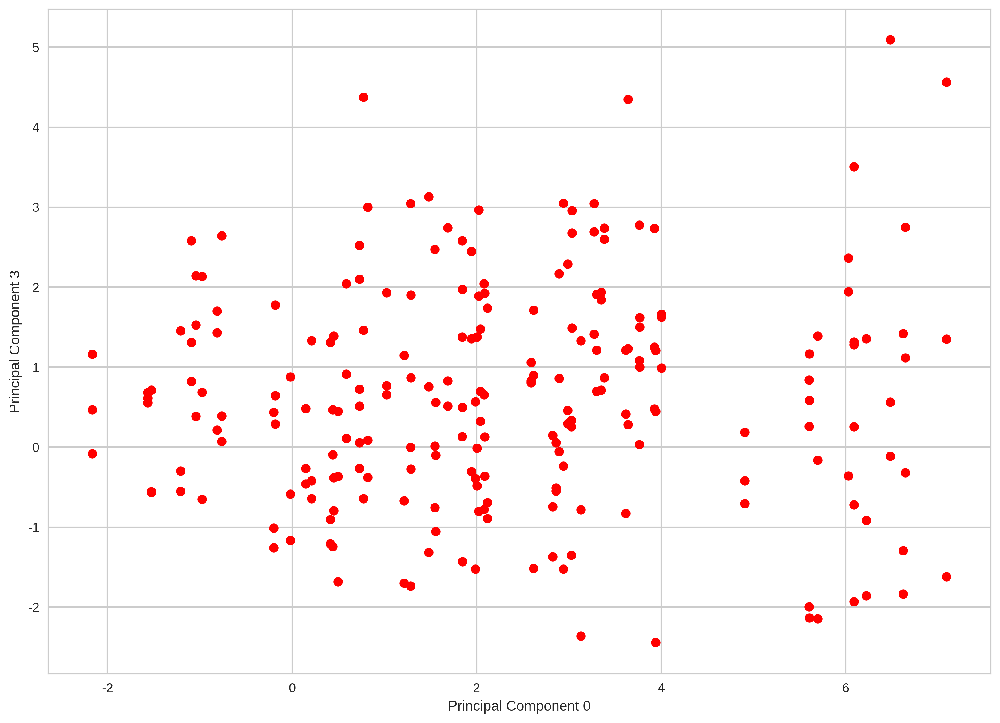

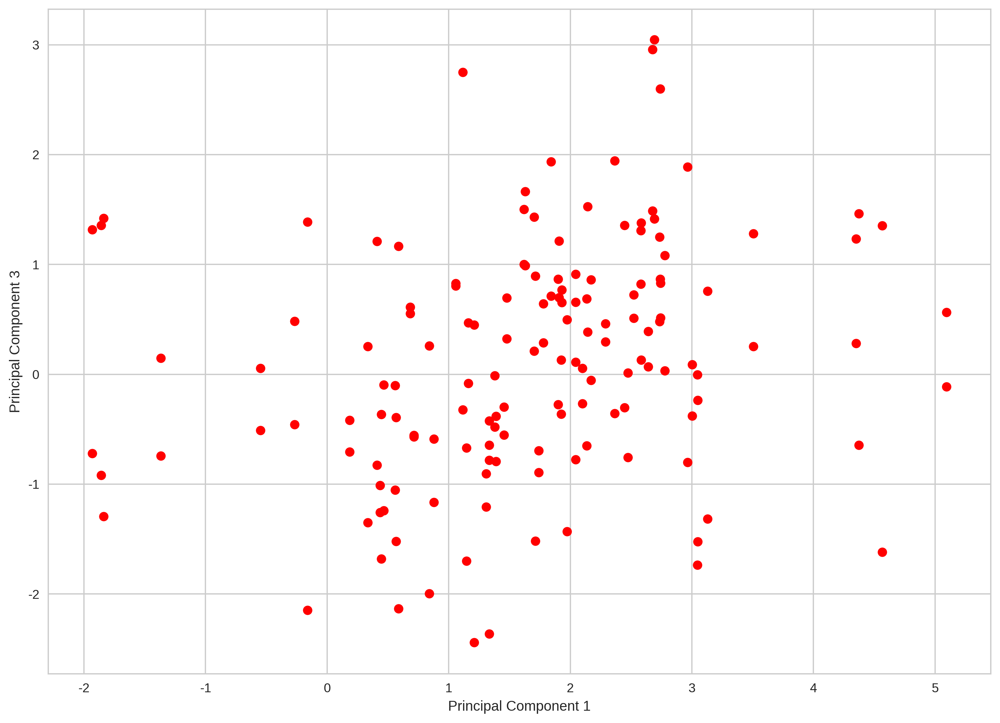

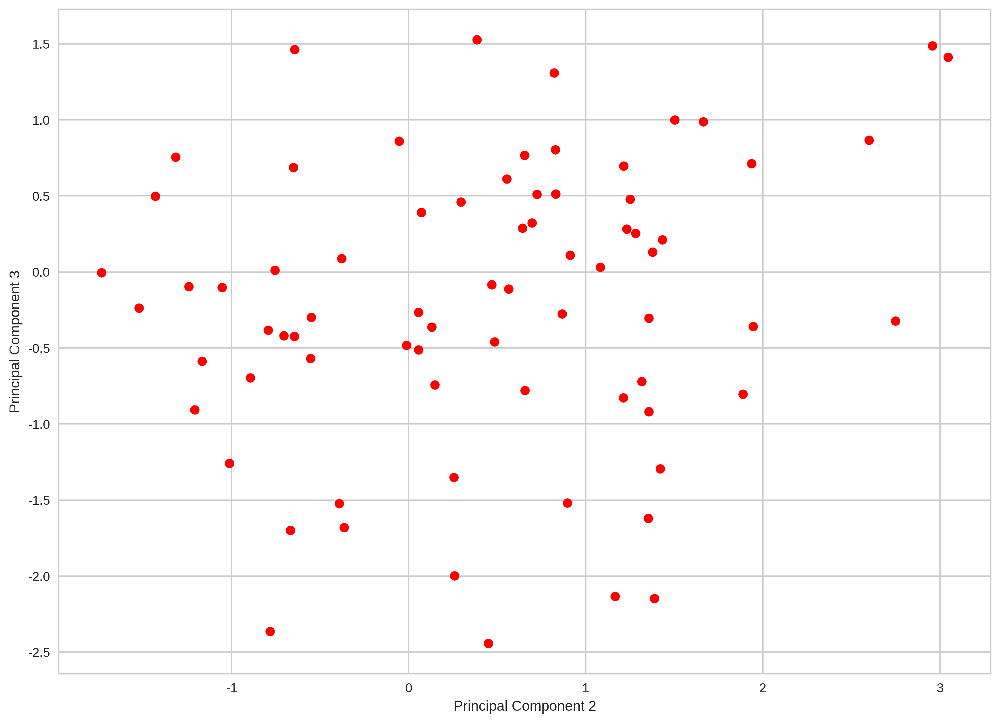

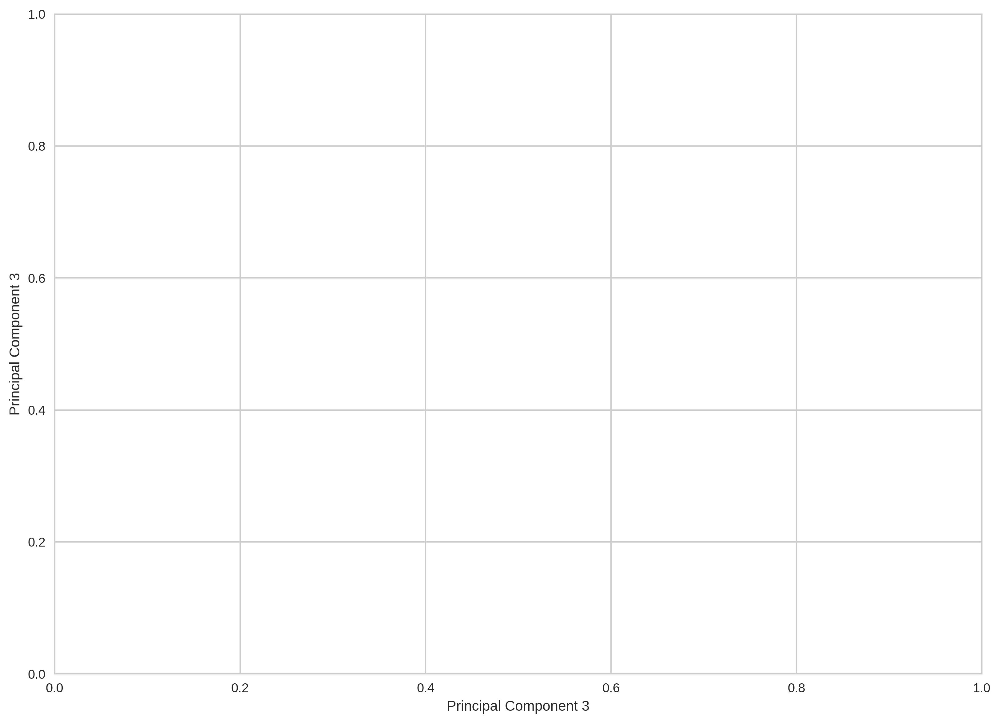

In [337]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(6, 4))
    for lab, col in zip(('PG','SG','SF','PF','C'),('blue', 'green', 'yellow', "orange",'red')):
        # 순서를 센터->포워드->가드 / 색깔은 무지개(빨-주-노-초-파)
            for i in range(4):
                for j in range(4):
                    if i<j:
                        plt.scatter(Y[y==lab, i],Y[y==lab, j],label=lab,c=col)
                plt.xlabel('Principal Component %s' %i)
                plt.ylabel('Principal Component %s' %j)
                plt.tight_layout()
                plt.show()

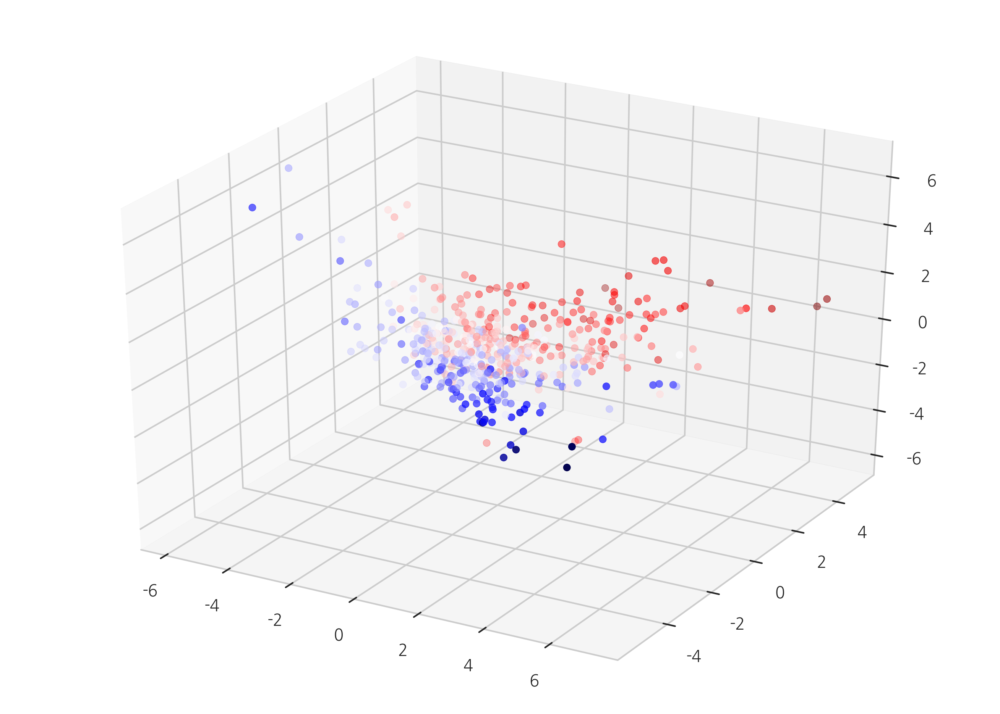

In [379]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x = Y[:,0]
y = Y[:,1]
z = Y[:,2]
c = y

ax.scatter(x,y,z,c=c,cmap="seismic")